# Comparação de representações: `PandasDataset` vs `PandasOverlapDataset`

Este notebook carrega **a mesma imagem** (mesmo `image_id`) usando as duas classes de dataset e mostra as duas visualizações lado a lado para comparação:

- **`PandasDataset`** — lê o *tile* único `tiles/{image_id}.png` (imagem original reduzida).
- **`PandasOverlapDataset`** — lê os patches em `bag_of_patches/{image_id}/`, ordena por quantidade de tecido (`tissue_ratio`) e monta um mosaico 6×6 com sobreposição (`overlap`).


In [1]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Este notebook vive em pos-propose/, então a raiz do repo fica um nível acima.
sys.path.append('..')
from utils.dataset import PandasDataset, PandasOverlapDataset

## Caminhos e dados

In [2]:
# Caminhos relativos a pos-propose/
ROOT_DIR    = '..'                       # raiz do repositorio
data_dir    = os.path.join(ROOT_DIR, 'data')
tiles_dir   = os.path.join(ROOT_DIR, '..', 'tiles')            # tiles unicos (.png)
patches_dir = os.path.join(ROOT_DIR, '..', 'bag_of_patches')   # pastas de patches por image_id

print('tiles_dir  :', os.path.realpath(tiles_dir), '| existe:', os.path.isdir(tiles_dir))
print('patches_dir:', os.path.realpath(patches_dir), '| existe:', os.path.isdir(patches_dir))

# Carrega o conjunto de teste e mantem apenas imagens presentes NAS DUAS fontes
df = pd.read_csv(os.path.join(data_dir, 'test.csv'))
df.columns = df.columns.str.strip()
df['image_id'] = df['image_id'].str.strip()

def in_both(image_id):
    tile_ok  = os.path.isfile(os.path.join(tiles_dir, f'{image_id}.png'))
    patch_ok = os.path.isdir(os.path.join(patches_dir, image_id))
    return tile_ok and patch_ok

df = df[df['image_id'].apply(in_both)].reset_index(drop=True)
print(f'\nImagens disponiveis nas duas fontes: {len(df)}')
df.head()

tiles_dir  : /home/woshington/Projects/Doutorado/tiles | existe: True
patches_dir: /home/woshington/Projects/Doutorado/bag_of_patches | existe: True

Imagens disponiveis nas duas fontes: 1590


,image_id,data_provider,isup_grade,gleason_score
0,5ad2c7349c24ed5c4901522bec9d3077,karolinska,0,0+0
1,96bb7ad81bef9aa7ce0280d7b49b6476,karolinska,4,4+4
2,cb9bc923249b183c8fc5b904f622695e,radboud,2,3+4
3,f7af5eef3236461e745cd8b81f1cf93b,karolinska,1,3+3
4,f35124ad7e0c9d8537a8e57966c06445,karolinska,0,0+0


## Datasets

Os dois datasets sao construidos sobre o mesmo dataframe, entao o indice `i` aponta para o mesmo `image_id` em ambos.

In [3]:
# transforms=None -> imagens no formato original (uint8, HWC internamente)
tile_dataset    = PandasDataset(tiles_dir, df, transforms=None, format='png')
overlap_dataset = PandasOverlapDataset(patches_dir, df, transforms=None, overlap=10)

print('tile_dataset   :', len(tile_dataset), 'amostras')
print('overlap_dataset:', len(overlap_dataset), 'amostras')

tile_dataset   : 1590 amostras
overlap_dataset: 1590 amostras


## Visualizacao lado a lado

Altere `sample_idx` para comparar outra imagem.

image_id: 5ad2c7349c24ed5c4901522bec9d3077  |  ISUP grade: 0
PandasDataset (tile)        -> shape (3, 1536, 1536)
PandasOverlapDataset (mosaic) -> shape (3, 1486, 1486)  (49 patches na pasta)


Figura salva em: logs/compare_datasets.png


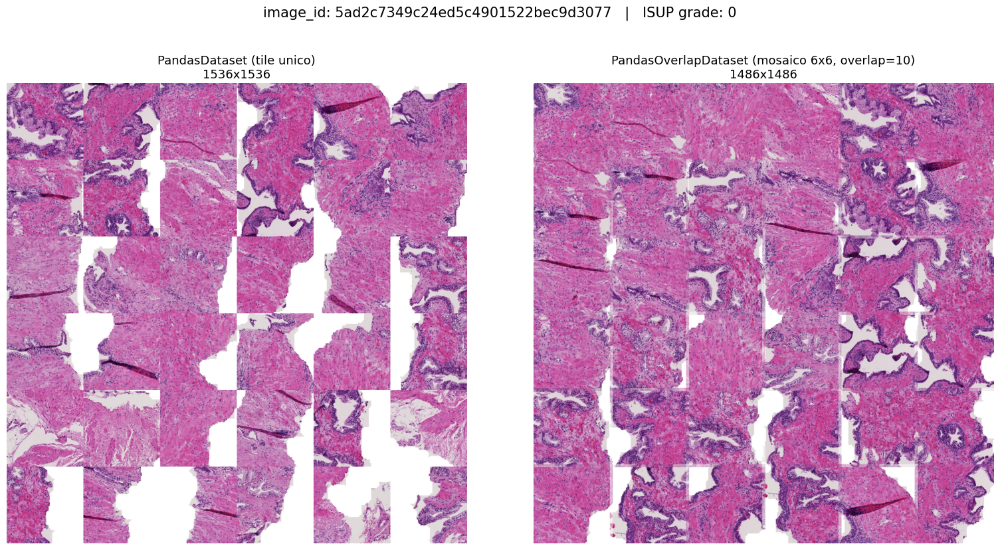

In [4]:
def to_hwc_uint8(tensor):
    """(C, H, W) float 0-255 -> (H, W, C) uint8 para exibicao."""
    img = tensor.numpy().transpose(1, 2, 0)
    return np.clip(img, 0, 255).astype(np.uint8)


def compare(sample_idx, save_path=None):
    image_id = df.iloc[sample_idx]['image_id']
    grade    = int(df.iloc[sample_idx]['isup_grade'])

    # Mesma imagem nas duas representacoes
    tile_tensor, _, _    = tile_dataset[sample_idx]
    mosaic_tensor, _, _  = overlap_dataset[sample_idx]

    tile_img   = to_hwc_uint8(tile_tensor)
    mosaic_img = to_hwc_uint8(mosaic_tensor)

    n_patches = len([
        f for f in os.listdir(os.path.join(patches_dir, image_id))
        if f.lower().endswith('.png')
    ])

    print(f'image_id: {image_id}  |  ISUP grade: {grade}')
    print(f'PandasDataset (tile)        -> shape {tuple(tile_tensor.shape)}')
    print(f'PandasOverlapDataset (mosaic) -> shape {tuple(mosaic_tensor.shape)}  ({n_patches} patches na pasta)')

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(tile_img)
    axes[0].set_title(f'PandasDataset (tile unico)\n{tile_img.shape[1]}x{tile_img.shape[0]}', fontsize=13)
    axes[0].axis('off')

    axes[1].imshow(mosaic_img)
    axes[1].set_title(f'PandasOverlapDataset (mosaico 6x6, overlap=10)\n{mosaic_img.shape[1]}x{mosaic_img.shape[0]}', fontsize=13)
    axes[1].axis('off')

    fig.suptitle(f'image_id: {image_id}   |   ISUP grade: {grade}', fontsize=15, y=1.03)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    if save_path is not None:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
        print(f'Figura salva em: {save_path}')
    plt.show()


sample_idx = 0
compare(sample_idx, save_path='logs/compare_datasets.png')

### Comparar varias imagens de uma vez

image_id: 5ad2c7349c24ed5c4901522bec9d3077  |  ISUP grade: 0
PandasDataset (tile)        -> shape (3, 1536, 1536)
PandasOverlapDataset (mosaic) -> shape (3, 1486, 1486)  (49 patches na pasta)


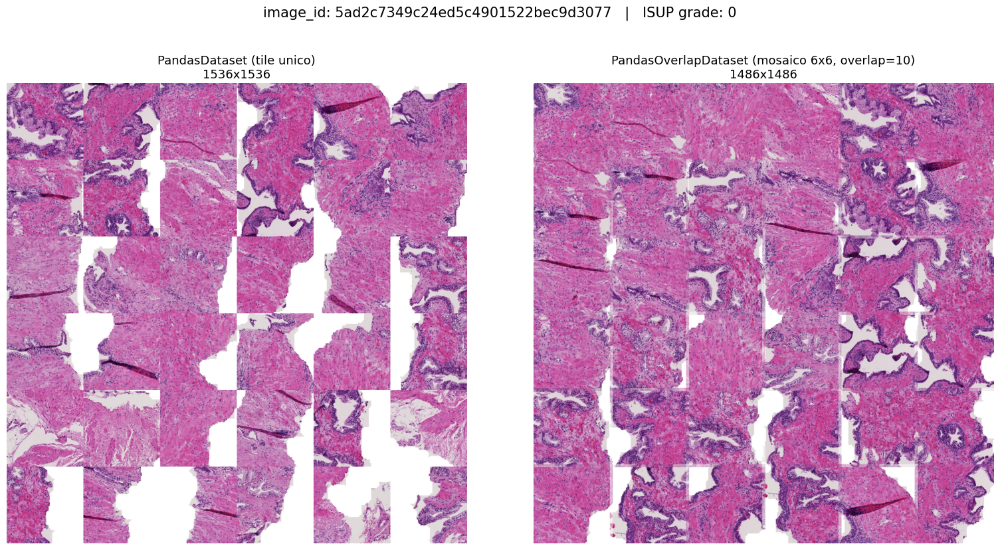

image_id: 96bb7ad81bef9aa7ce0280d7b49b6476  |  ISUP grade: 4
PandasDataset (tile)        -> shape (3, 1536, 1536)
PandasOverlapDataset (mosaic) -> shape (3, 1486, 1486)  (49 patches na pasta)


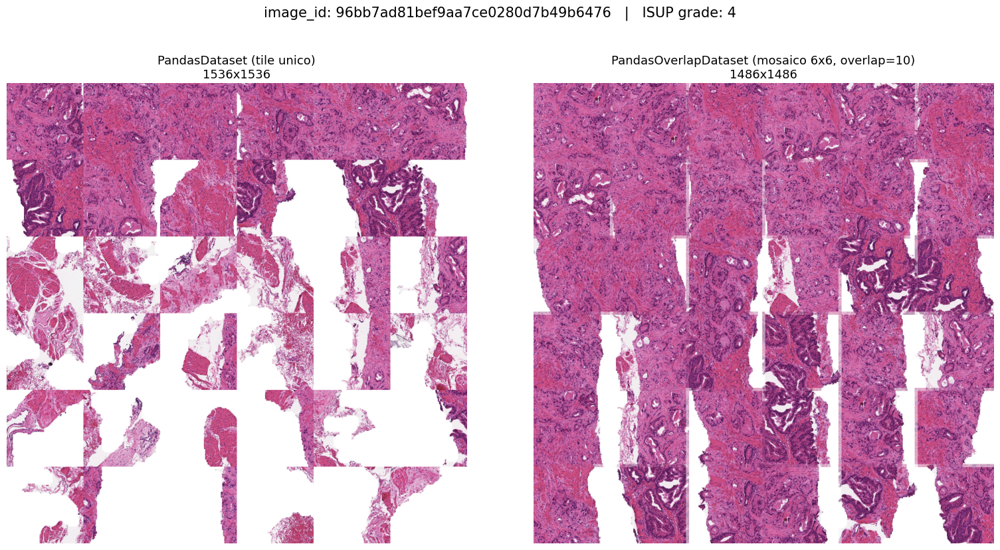

image_id: cb9bc923249b183c8fc5b904f622695e  |  ISUP grade: 2
PandasDataset (tile)        -> shape (3, 1536, 1536)
PandasOverlapDataset (mosaic) -> shape (3, 1486, 1486)  (49 patches na pasta)


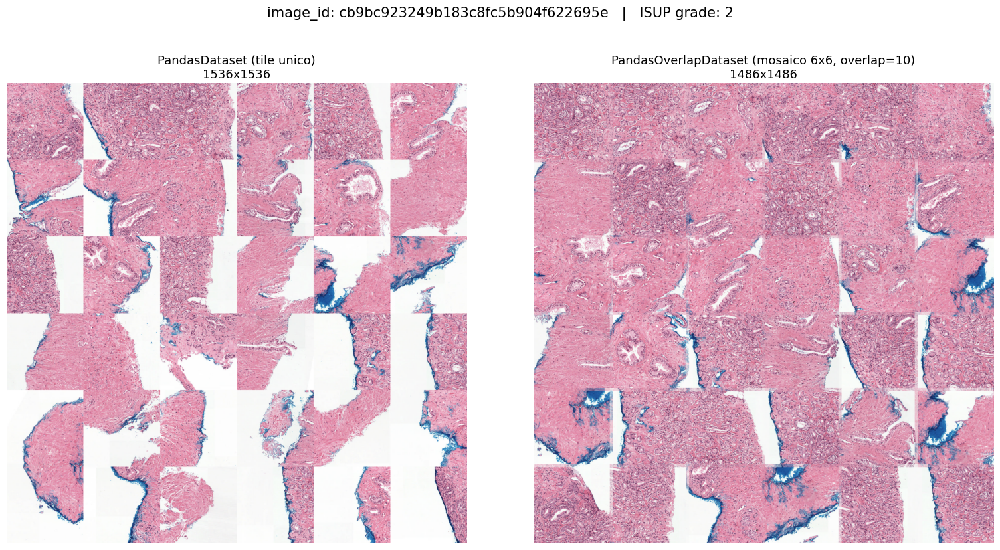

In [5]:
for i in [0, 1, 2]:
    compare(i)